# PS6: Particle Tracking

In [5]:
# Imports
import cv2 as cv
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import time
# Matplotlib params
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['figure.titlesize'] = 24
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'
plt.rcParams['lines.markersize'] = 1
# Play video file while tracking
DISPLAY_VIDEO = True

## 1. Particle Filter Tracking

In [6]:
# video file
videofile = 'pres_debate.avi'

with open('pres_debate.txt', 'r') as f:
    x0, y0, w0, h0 = [int(float(x)) for x in f.readline().split()]

In [7]:
def get_frame(video, n):
    video.set(cv.CAP_PROP_POS_FRAMES, n)
    ret, frame = video.read()
    return frame


In [8]:
# fisrt frame
video = cv.VideoCapture(videofile)
first_frame = get_frame(video, 0)
# plt.imshow(first_frame)
h, w = first_frame.shape[:2]
face = first_frame[y0: y0+h0, x0: w0+x0]
# plt.imshow(face)

In [30]:
# particle filter
class ParticleFilter:
    def __init__(self, template, h, w, include_scale = False, N = 100, sigma_error = 0.04, sigma_dynamic = 10, sigma_scale = 0.2,
    alpha = None, random_ratio = 0.0, colour = True):
        
        self.colour = colour
        if self.colour:
            self.template = template.astype(float)[:,:,::-1] / 255
        else:
            self.template = cv.cvtColor(template, cv.COLOR_BGR2GRAY).astype(float) / 255
        self.h, self.w = h, w
        self.N = N
        self.sigma_error = sigma_error
        self.sigma_dynamic = sigma_dynamic
        self.sigma_scale = sigma_scale
        self.alpha = alpha
        self.random_ratio = random_ratio
        self.include_scale = include_scale
        self.ht, self.wt = self.template.shape[:2]
        self.weights = np.full(N, 1/N)

        if self.include_scale:
            self.particles = np.zeros((N, 3))
            self.particles[:, 2] = np.random.uniform(0.1, 1.0, N)
        else:
            self.particles = np.zeros((N, 2))
        self.particles[:, 0] = np.random.uniform(0, w, N)
        self.particles[:, 1] = np.random.uniform(0, h, N)
       
        return
    

    #predict   
    def predict(self):
        '''predict next state of particles'''
        noise = np.random.normal(0, self.sigma_dynamic, (self.N, 2))
        self.particles[:, :2] += noise
        if self.include_scale:
            noise = np.random.normal(0, self.sigma_scale, self.N)
            self.particles[:, 2] += noise
            self.particles[:, 2] = np.clip(self.particles[:, 2], 0.2, 1.0)
        
        self.particles[:, 0] = np.clip(self.particles[:, 0], 0, self.w - 1)
        self.particles[:, 1] = np.clip(self.particles[:, 1], 0, self.h - 1)
                  
        return

    #update
    def update(self, frame):
        '''
        Update weights of set of particles.
        '''
        weights = np.zeros(self.N)        
        for ix in range(self.N):
            x, y = self.particles[ix, :2]
            template_scaled = self.template
            if self.include_scale:
                scale = self.particles[ix, 2]
                template_scaled = cv.resize(self.template, None, fx=scale, fy=scale)
            ht, wt = template_scaled.shape[:2]
            x1 = int(x - wt//2)
            x2 = x1 + wt
            y1 = int(y - ht//2)
            y2 = y1 + ht
            state = frame[y1:y2, x1:x2]
            if state.shape == template_scaled.shape:
                mse = np.mean((template_scaled - state)**2)
                p = np.exp(-mse/(2*self.sigma_error**2))
            else:
                p = 0.0
            weights[ix] = p
        weights_sum = np.sum(weights)
        if not weights_sum == 0.0:
            weights /= weights_sum
        else:
            weights = np.full(self.N, 1/self.N)
        self.weights = weights
        return

    #resample
    def resample(self):
        '''
        Resample set based on weights.
        '''
        indices = np.random.choice(self.N, size=self.N, p=self.weights)
        self.particles = self.particles[indices]        
        # Add some random particles
        rand_cnt = int(self.random_ratio*self.N)
        if rand_cnt > 0:
            self.particles[-rand_cnt:, 0] = np.random.uniform(0, self.w, rand_cnt)
            self.particles[-rand_cnt:, 1] = np.random.uniform(0, self.h, rand_cnt)
            if self.include_scale:
                self.particles[-rand_cnt:, 2] = np.random.uniform(0.2, 1.0, rand_cnt)
        return

    #estimate
    def estimate(self):
        '''estimate location of object'''
        avg = np.average(self.particles, axis=0, weights=self.weights)
        self.avg_pos = avg[:2]

        if self.include_scale:
            self.avg_scale = avg[2]
        diff = self.particles[:, :2] - self.avg_pos
        distance = np.sqrt(diff[:, 0]**2 + diff[:, 1]**2)
        self.radius = np.average(distance, weights=self.weights).astype(int)
        return

    # update template
    def update_template(self, frame):
        '''update template'''
        x, y = self.avg_pos.astype(int)
        x1 = x - self.wt // 2
        y1 = y - self.ht // 2

        state = frame[y1: y1+self.ht, x1: x1+self.wt]
        self.template = self.alpha*state + (1-self.alpha)*self.template
        return

    def step(self, frame):
        '''step particle filter'''
        self.predict()
        self.update(frame)
        self.resample()
        self.estimate()
        if not self.include_scale and self.alpha:
            self.update_template(frame)
        return

    def plot_particles(self, ax, colour='r'):
        '''
        Get state estimate as weighted mean of particles
        '''
        ax.scatter(self.particles[:, 0], self.particles[:, 1], color=colour)
        return

    def plot_window(self, ax, colour='lime'):
        '''
        Get state estimate as weighted mean of particles
        '''
        x, y = self.avg_pos.astype(int)
        template_scaled = self.template
        if self.include_scale:
            template_scaled = cv.resize(self.template, (0, 0), fx=self.avg_scale, fy=self.avg_scale)
        ht, wt = template_scaled.shape[:2]

        x1 = x - wt // 2
        y1 = y - ht // 2
        rect = patches.Rectangle((x1, y1), wt, ht, linewidth=1, edgecolor=colour, facecolor='none')
        ax.add_patch(rect)
        return

    def plot_radius(self, ax, colour='g'):
        '''
        Get state estimate as weighted mean of particles
        '''
        x, y = self.avg_pos.astype(int)
        circle = patches.Circle((x, y), self.radius, linewidth=1, edgecolor=colour, facecolor='none')
        ax.add_patch(circle)
        return

    def plot_template(self, ax, colour='lime'):
        '''
        plot template
        '''
        ax.imshow(self.template)
        rect = patches.Rectangle((0, 0), self.wt, self.ht, linewidth=2, edgecolor=colour, facecolor='none')
        # Add the patch to the Axes
        ax.add_patch(rect)
        return
    
    def plot(self, ax, frame):
        '''
        plot template
        '''
        ax.imshow(frame)
        self.plot_template(ax)
        self.plot_window(ax)
        self.plot_radius(ax)
        self.plot_particles(ax)
        return

    def draw_opencv(self, frame, window_name = ''):
        '''Using opencv to draw the result'''
        if self.colour:
            frame[:self.ht, :self.wt] = 255 * self.template[:,:,::-1]
        else:
            frame[:self.ht, :self.wt] = 255 * self.template[:,:, np.newaxis]
        cv.rectangle(frame, (0, 0), (self.wt, self.ht), (0, 255, 0), 2)
        for p in self.particles.astype(int):
            x, y = p[:2].astype(int)
            cv.circle(frame, (x, y), 2, (0,0,255), -1)
        
        #scaling
        x ,y = self.avg_pos.astype(int)
        template_scaled = self.template
        if self.include_scale:
            scale = self.avg_scale
            template_scaled = cv.resize(self.template, None, fx=scale, fy=scale)
        # draw rectangle
        ht, wt = template_scaled.shape[:2]
        x1 = x - wt // 2
        y1 = y - ht // 2

        cv.rectangle(frame, (x1, y1), (x1+wt, y1+ht), (0, 255, 0), 2)

        # draw circle
        cv.circle(frame, (x, y), self.radius, (255, 255, 255), 2)
        cv.imshow(window_name, frame)
        return

    def __call__(self, videofile, frames=[], display_video=False):
        '''
        Run the PF on the input video file and track the template.
        '''
        ix = 1
        cap = cv.VideoCapture(videofile)
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            if self.colour:
                framep = frame.astype(float)[:, :, ::-1] / 255
            else:
                framep = cv.cvtColor(frame, cv.COLOR_BGR2GRAY).astype(float) / 255
            self.step(framep)

            if ix in frames:
                fig, ax = plt.subplots(1, 1)
                ax.set_title('Frame {}'.format(ix))
                ax.axis('off')
                
                self.plot(ax, framep)
            if display_video:
                self.draw_opencv(frame, window_name=videofile)
                if cv.waitKey(1) & 0xFF == ord('q'):
                    break
            ix += 1
        cv.destroyAllWindows()
        cap.release()
        return

    def evaluate_performance(self, videofile, ground_truth=None):
        """
        Evaluate the performance of the particle filter on a given video.
        :param videofile: Path to the video file.
        :param ground_truth: Optional ground truth data for accuracy assessment.
        :return: Dictionary containing performance metrics.
        """
        start_time = time.time()
        cap = cv.VideoCapture(videofile)
        frame_count = 0
        total_error = 0
        stability_measure = 0
        prev_pos = None

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            frame_count += 1
            self.step(frame)

            # Accuracy assessment (if ground truth is available)
            if ground_truth:
                error = self.calculate_error(ground_truth[frame_count])
                total_error += error

            # Stability assessment
            if prev_pos is not None:
                stability_measure += np.linalg.norm(self.avg_pos - prev_pos)
            prev_pos = np.array(self.avg_pos)

        cap.release()

        elapsed_time = time.time() - start_time
        avg_error = total_error / frame_count if ground_truth else None
        avg_stability = stability_measure / (frame_count - 1)

        print('average_error:',  avg_error,'\n', 'average_stability:', avg_stability,'\n','processing_time:', elapsed_time,'\n', 'frames_processed: ', frame_count)

        return {
            'average_error': avg_error,
            'average_stability': avg_stability,
            'processing_time': elapsed_time,
            'frames_processed': frame_count
        }

average_error: None 
 average_stability: 10.739754113331985 
 processing_time: 3.427265167236328 
 frames_processed:  312


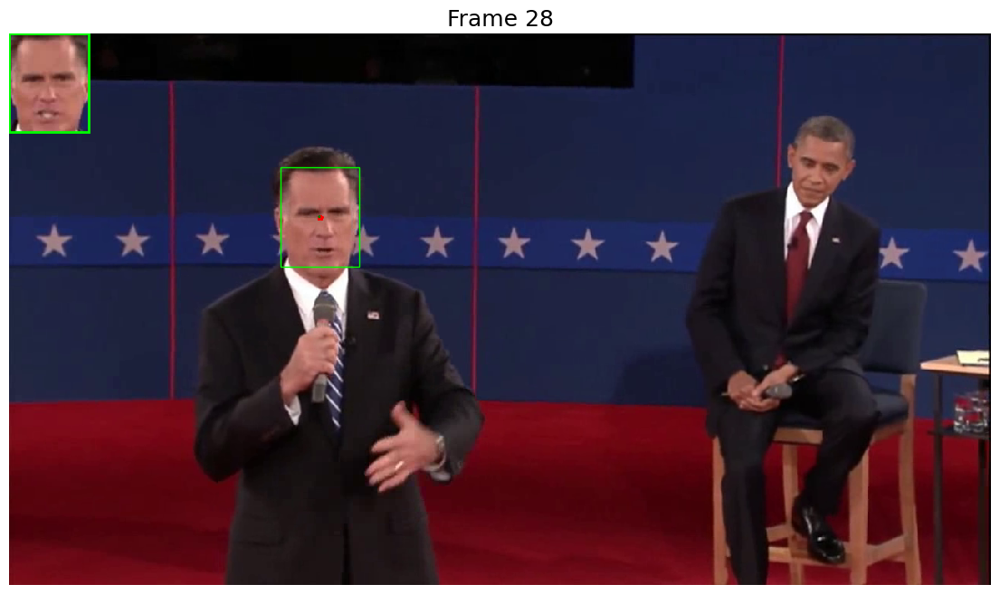

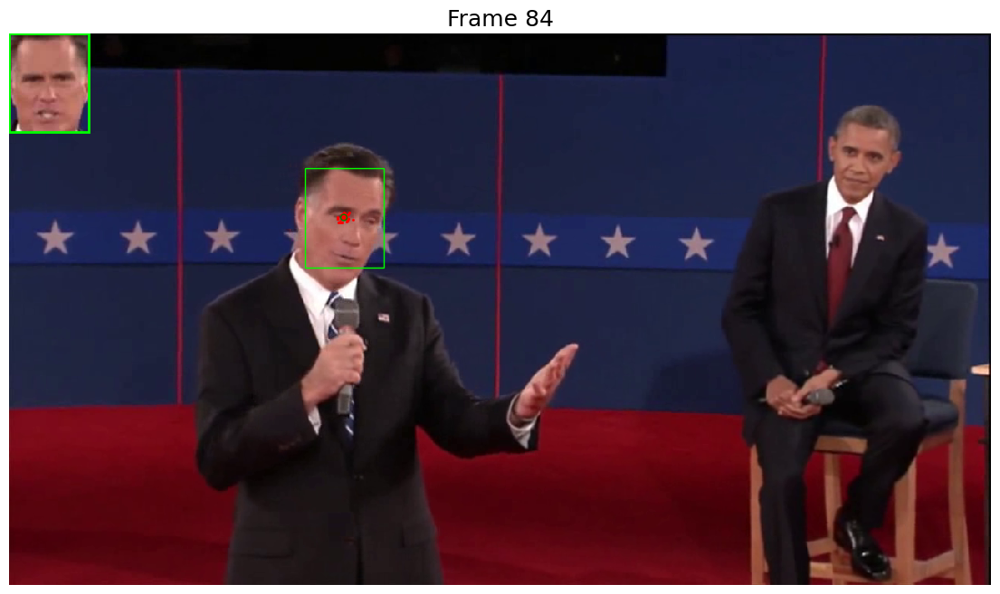

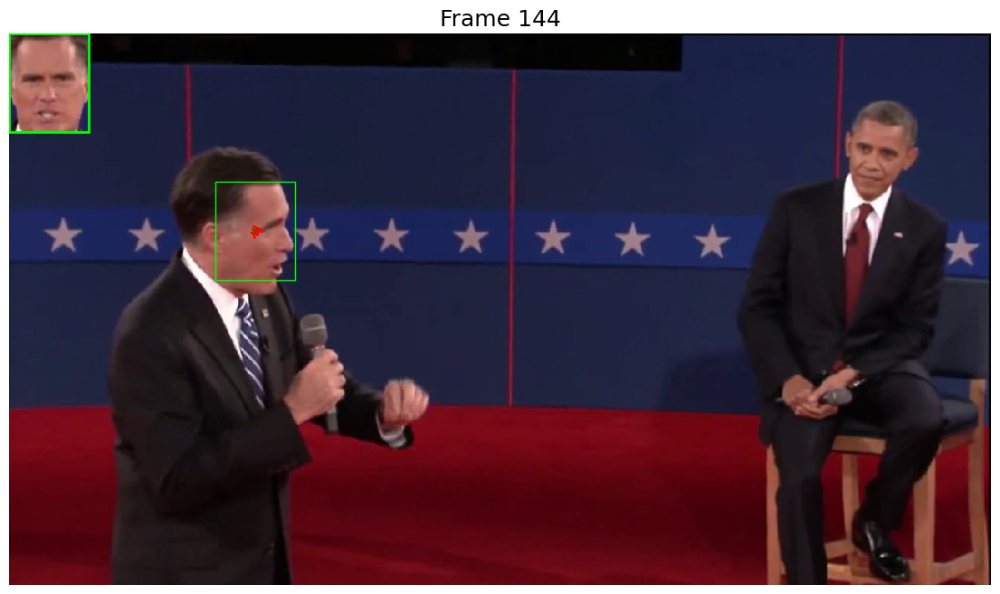

In [10]:
frames = [28, 84, 144]
face_tracker = ParticleFilter(face, h, w, N=150, sigma_error=0.02)
face_tracker(videofile, frames=frames, display_video=DISPLAY_VIDEO)
performance_metrics = face_tracker.evaluate_performance(videofile)

### 1.2 Effect of Window Size
#### Advantages of Larger Window Size:
* **Improved Feature Representation**:
  A larger window can capture more features of the object, providing a more comprehensive representation, which can be beneficial for tracking.
* **Better Handling of Complex Backgrounds**:
  With more context around the object, the tracker might be less prone to getting distracted by similar features in the background.
* **Stability in Presence of Noise or Occlusions**:
  A larger window may offer more resilience against visual noise or partial occlusions, as the increased area provides more data to work with.
#### Advantages of Smaller Window Size:
* **Faster Computation**:
  A smaller window size results in fewer pixels to process, which can speed up the computation, beneficial for real-time tracking.
* **Enhanced Adaptability**:
  Smaller windows can adapt more quickly to changes in the object's appearance or shape, especially for non-rigid objects.
* **Reduced Influence of Background**:
 A smaller window is more likely to focus tightly on the object, reducing the influence of the surrounding background and potential distractors.
#### Trade-offs:
Larger windows provide more detail but can slow down the processing, whereas smaller windows are faster but may capture less information.

Larger windows might provide stability in tracking but can be less adaptable to rapid changes, while smaller windows are more adaptable but might be less stable.

### 1.3 Effect of $\sigma_{MSE}$
$\sigma_{MSE}$ is represented as self.sigma_error in codes, which is used in the 'update' method when calculating the weights of the particles based on the MSE betweem the template and the corresponding patch of the frame for each particle.
* A smaller value of $\sigma_{MSE}$ makes the tracker more sensitive to differences between the template and the image patches. Particles will need to closely match the template to be assigned significant weights.
* A larger $\sigma_{MSE}$ value makes the tracker more tolerant to differences between the template and the patches. Even particles with less accurate matching can still receive considerable weights.
* Lower values of $\sigma_{MSE}$ may lead to higher precision in tracking but can make the tracker less robust to variations in appearance, noise, or partial occlusions.
* Higher values can increase robustness but may reduce the precision of the tracking.


### 1.4 Optimizing number of particles
When the number of particles are more than 80, the tracking would have good performance.Base on the average_stability and processing_time, it can be seen that higher number of particles makes the tracking process computationally expensive.

### 1.5 Nosisy debate

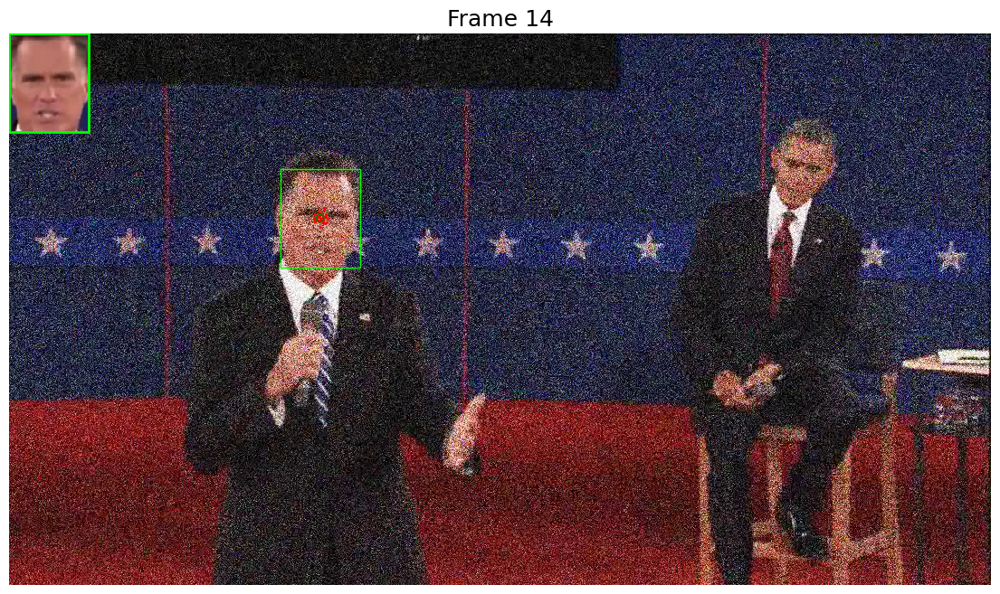

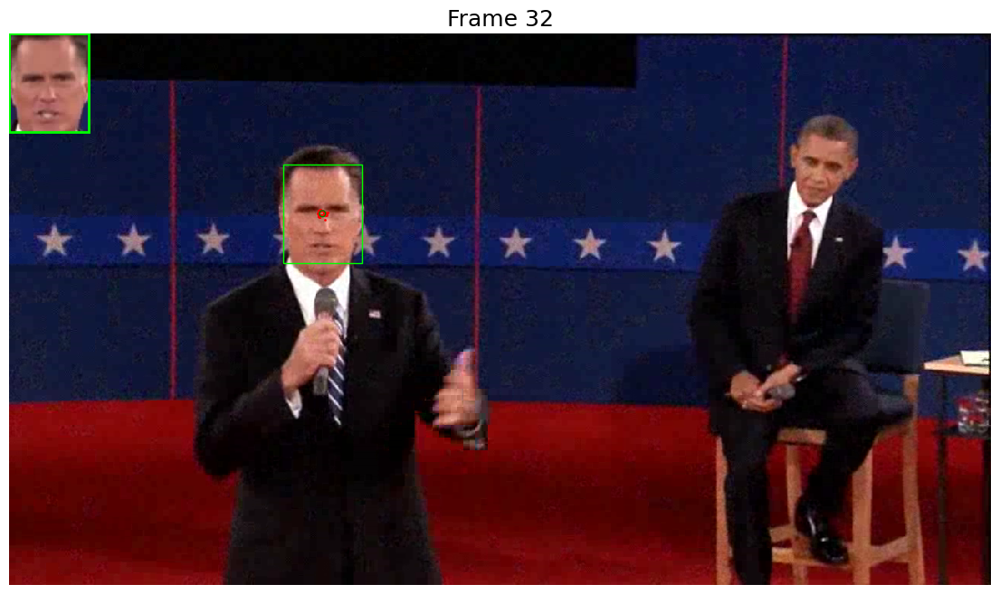

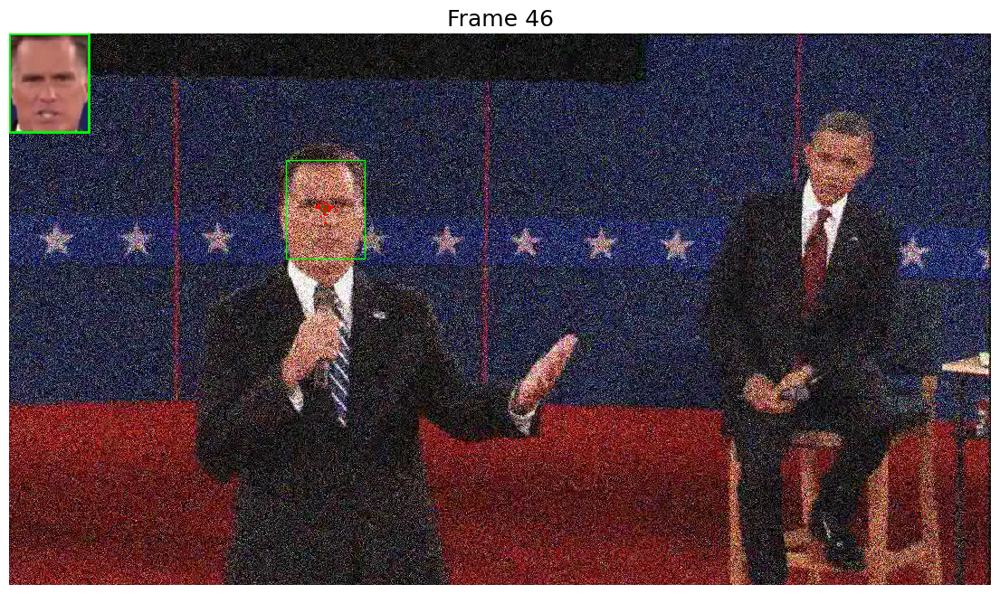

In [11]:
noisyvideo = 'noisy_debate.avi'
frames = [14, 32, 46]
face_tracker = ParticleFilter(face, h, w, N=100)
face_tracker(noisyvideo, frames=frames, display_video=DISPLAY_VIDEO)

When video contains noise, particles become scattered. As noise levels decrease, particles join together. In particle tracking, the dispersion of particles in noisy frames and their concentration when noise reduces is a consequence of how particle filters handle uncertainty and noise in the tracking environment.

The reason is: When there is a lot of noise in a frame, it creates uncertainty about the system's actual state. The particle filter responds by scattering its particles more extensively to investigate a broader spectrum of possible states. This distribution is a method of displaying increased uncertainty – the filter extends its bets over a more massive space.

## 2. Appearance Model Update

In [36]:
videofile = 'pres_debate.avi'
video = cv.VideoCapture(videofile)
# Template position
x0, y0, w0, h0 = 520, 375, 105, 129
firstframe = get_frame(video, 0)
h, w = firstframe.shape[:2]
hand = firstframe[y0:y0+h0, x0:x0+w0]
#plt.imshow(hand)

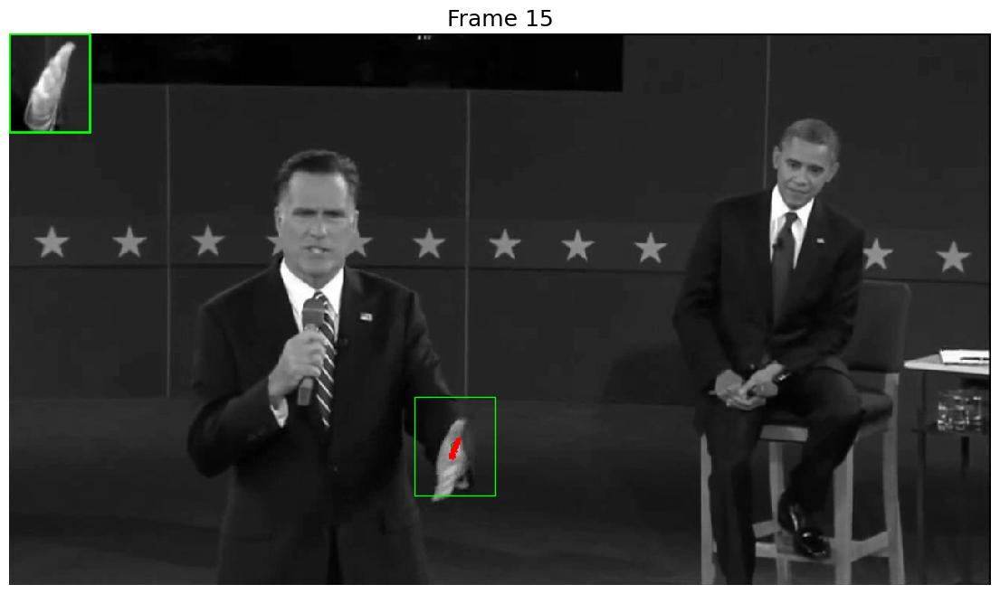

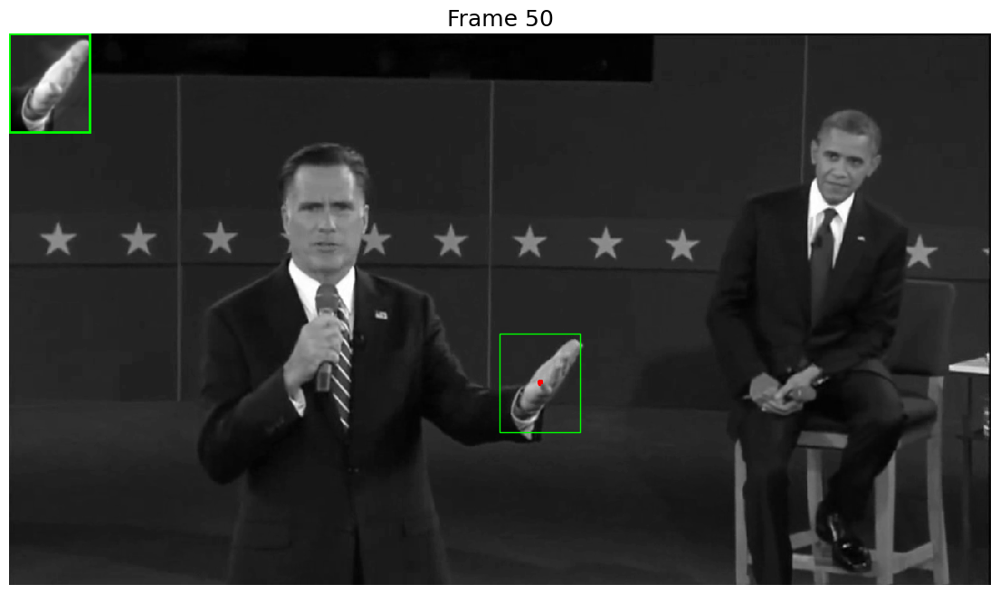

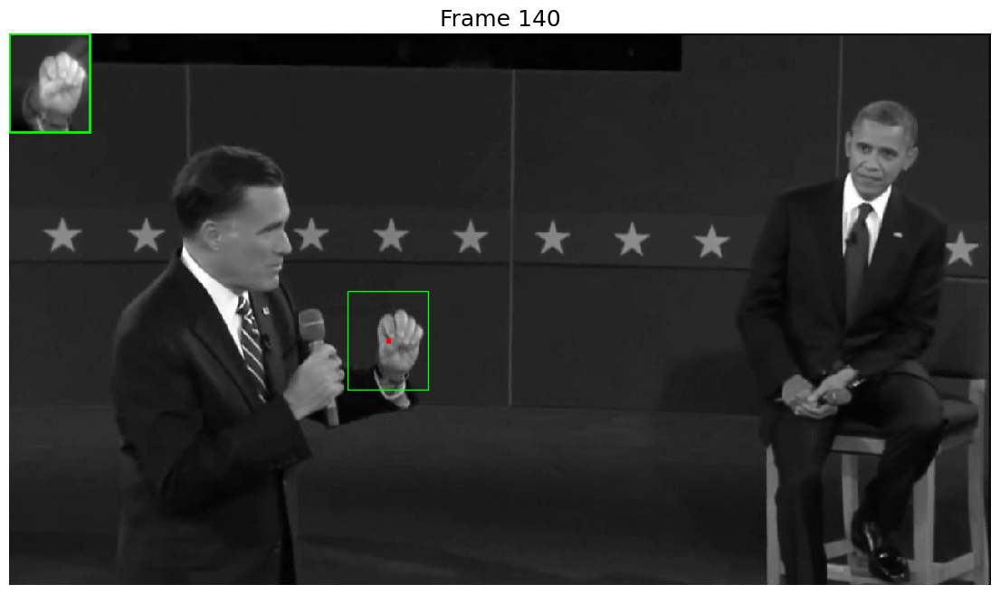

In [37]:
frames = [15, 50, 140]
hand_tracker = ParticleFilter(hand, h, w, N=1000, sigma_error=0.01, alpha=0.1, colour=False)
hand_tracker(videofile, frames=frames, display_video=DISPLAY_VIDEO)

### 2.2 Noisy Hand

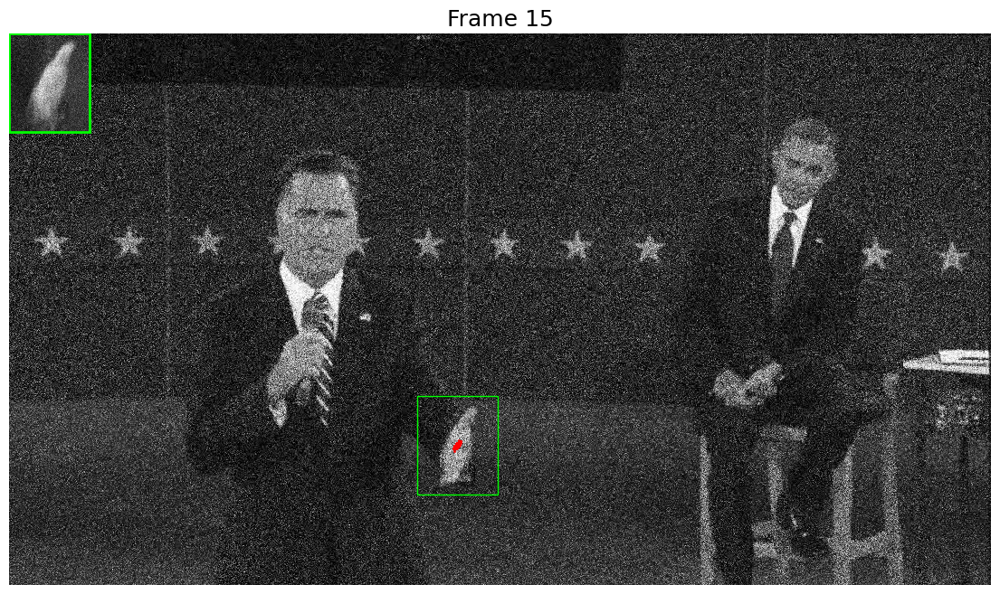

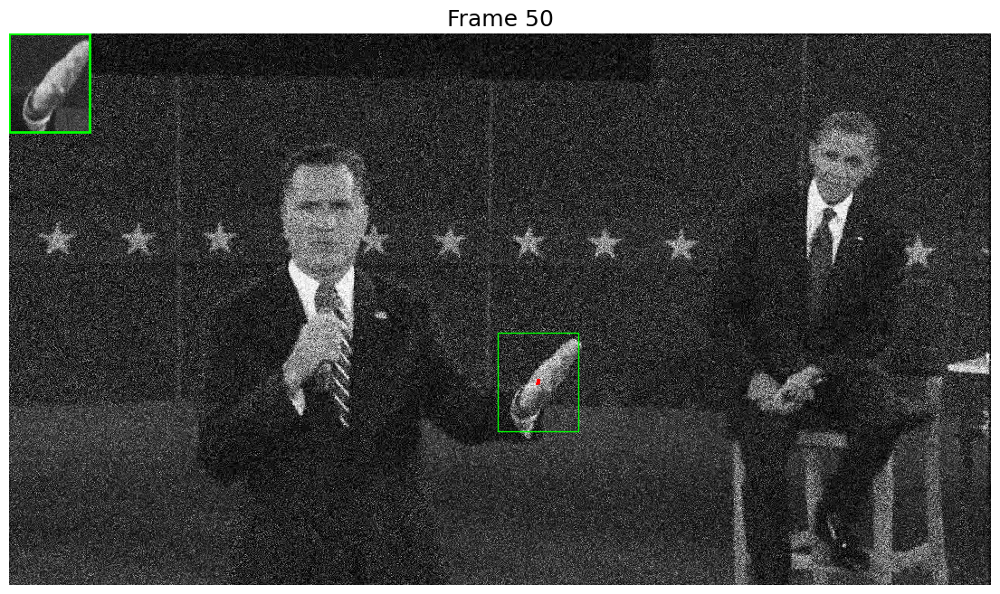

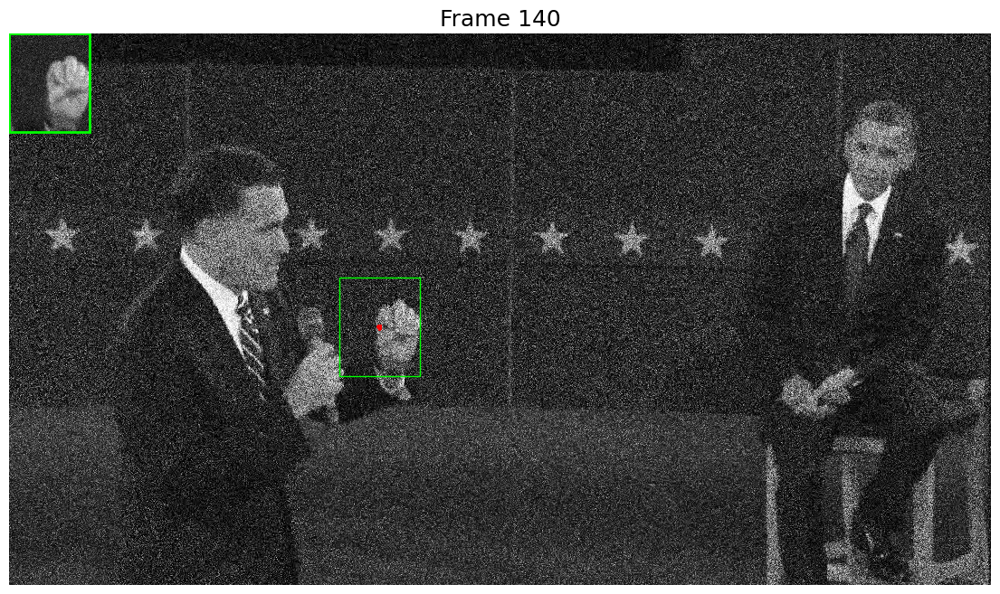

In [51]:
frames = [15, 50, 140]
hand_tracker = ParticleFilter(hand, h, w, N=1500,  sigma_error=0.01, alpha=0.3, colour=False)
hand_tracker(noisyvideo, frames=frames, display_video=DISPLAY_VIDEO)

The hand tracking in noisy video is much harder than clean one, I adjust the particle number and alpha to get better performance of tracking. I increased the number of particles from 1000 to 1500 and increased the alpha from 0.1 to 0.3. I also set the tracker to the colorless version.

## 3. Incorporating More Dynamics

In [56]:
videofile = 'pedestrians.avi'
video = cv.VideoCapture(videofile)

with open('pedestrians.txt', 'r') as f:
    x0, y0, w0, h0 = [int(float(n)) for n in f.readline().split()]

# Extract template
firstframe = get_frame(video, 0)
h, w = firstframe.shape[:2]
woman = firstframe[y0:y0+h0, x0:x0+w0]
# plt.imshow(woman)

### 3.1 Tracking the woman

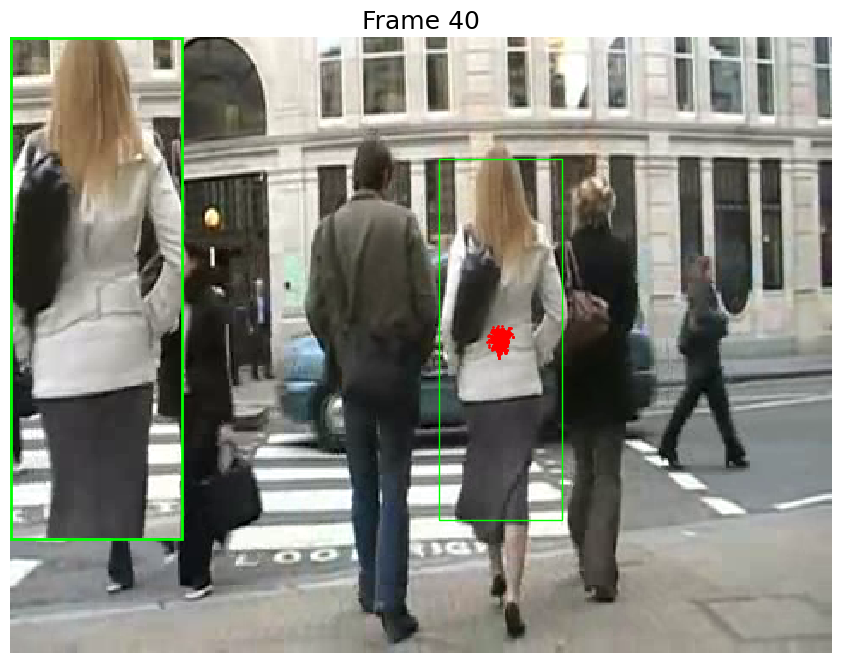

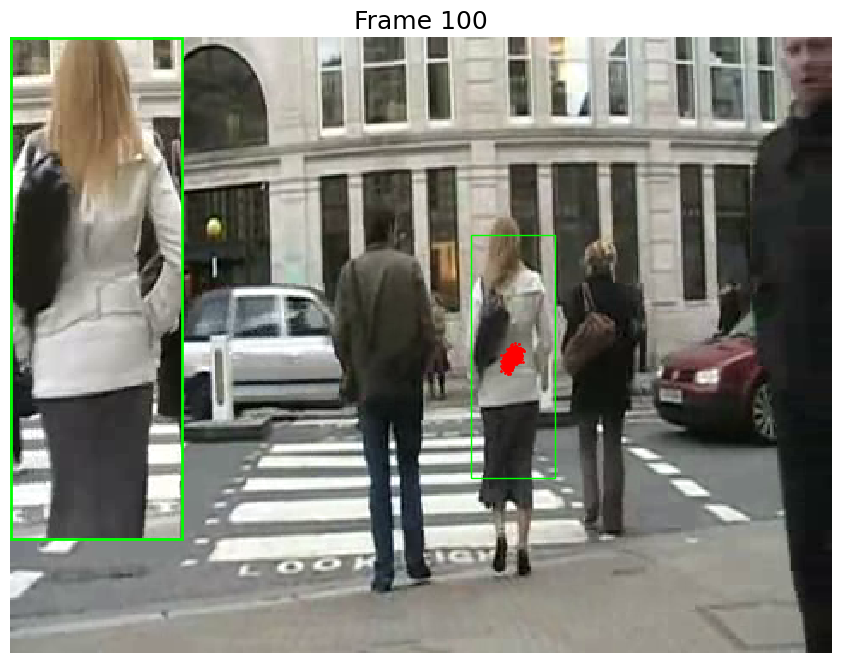

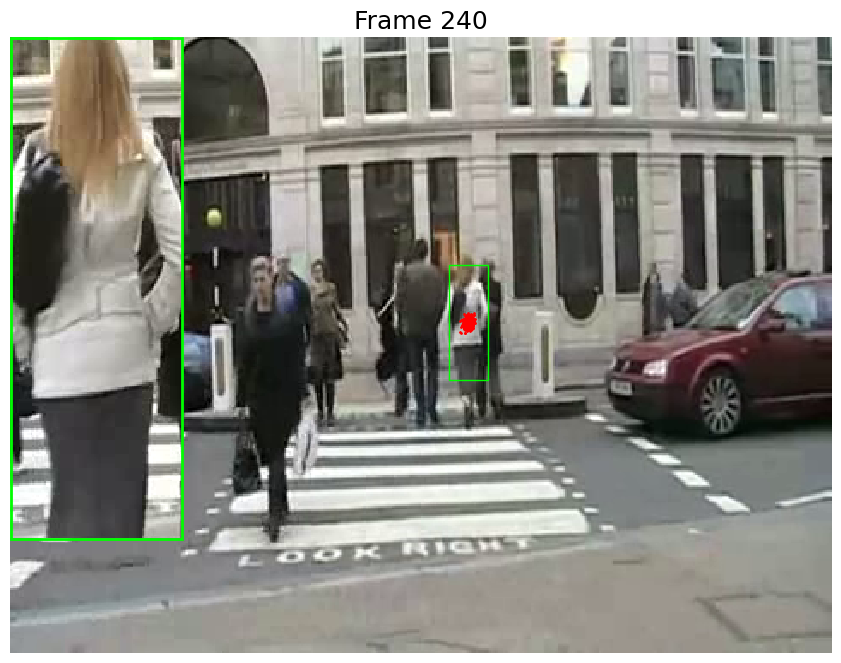

In [66]:
frames = [40, 100, 240]
woman_tracker = ParticleFilter(woman, h, w, include_scale=True, N=1000, sigma_error=0.1, sigma_dynamic=1, sigma_scale=0.01, random_ratio=0.0)
woman_tracker(videofile, frames=frames, display_video=DISPLAY_VIDEO)

### 3.2 Optimizaing the number of particles

The least filter to get good performance in woman tracking task is 1000, while in 1.4, we only need 80. It is because the image of the woman in the video is experiencing the 3D changes, while in the hand tracking task, the hand's position is more like experiencing 2D changes. So we need more (even exponentially growing) number of particles to track the exact position of the template.

Particle filters work by approximating the probability distribution of the system state with a finite set of samples (particles).As the dimensionality of the problem increases, the volume of the state space grows exponentially - a phenomenon known as the "curse of dimensionality". To maintain an accurate representation of this space, a significantly larger number of particles is required.